# Tassy Detect Deforestation

In [1]:
#General
import glob
import xarray as xr
import rioxarray
import pandas as pd
import geopandas as gpd
import numpy as np
from rasterio import features
from pyproj import Transformer

from matplotlib.colors import ListedColormap
import matplotlib.pyplot as plt

#DEA tools
import sys
sys.path.insert(1, '../Tools/')
from dea_tools.datahandling import paths_to_datetimeindex, load_ard
from dea_tools.plotting import rgb, display_map
from datacube.utils.cog import write_cog
from dea_tools.spatial import xr_rasterize

#Planetary computer
import pystac_client
import planetary_computer
import matplotlib.pyplot as plt

import datacube
import odc.stac
import odc.geo.xr
from odc.geo.geom import BoundingBox

### Load satellite input dataset
Sentinel1-rct (band-c) with features vv and vh, from the planetary computer

In [2]:
#Connect to datacube
dc = datacube.Datacube(app="Planetary_computer")

In [3]:
# Define the area of interest styx pre site selection (1220840.0143, 1258259.6732) (-4742005.5336,-4762156.5046) EPSG:3577
#longitude =  (1220840.0143, 1258259.6732) #EPSG:3577 VS EPSG:4326 (146.5001688,146.9685348)
#latitude = (-4742005.5336,-4762156.5046) #EPSG:3577 VS EPSG:4326 (-42.7492325,-42.8950499)

# Create a transformer from EPSG:3577 to EPSG:4326
transformer = Transformer.from_crs("EPSG:3577", "EPSG:4326", always_xy=True)

#  bounding box coordinates values in CRS EPSG:3577
left_3577, right_3577 = 1220840, 1258260
bottom_3577, top_3577 = -4762157, -4742006

left_4326, bottom_4326 = transformer.transform(left_3577, bottom_3577)
right_4326, top_4326 = transformer.transform(right_3577, top_3577)

left_4326 = round(left_4326, 4)
bottom_4326 = round(bottom_4326, 4)
right_4326 = round(right_4326, 4)
top_4326 = round(top_4326, 4)

print(left_4326,bottom_4326,right_4326,top_4326)

146.5273 -42.9351 146.9406 -42.7093


In [4]:
display_map(x=(left_4326, right_4326), y=(bottom_4326,top_4326))

In [4]:
# Set the range of dates for the analysis
time = {'t2021': ('2021-04-01','2021-04-30'),
        't2022': ('2022-04-01', '2022-04-30'),
        't2023': ('2023-04-01', '2023-04-30'),
        't2024': ('2024-04-01', '2024-04-30')
       }

In [5]:
# Open a pystack client pointing to the Microsoft Planetary Computer data catalogue
catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1",
    modifier=planetary_computer.sign_inplace,
)

In [6]:
#Sentinel1 Load parameters
time_range = "/".join(time.get('t2021'))

# Convert data-cube style queries into something readable by `pystac_client`

#bbox = BoundingBox.from_xy(longitude, latitude)
bbox = BoundingBox(left_4326, bottom_4326, right_4326, top_4326, crs="EPSG:4326")

# Search for STAC items from "sentinel-1-rtc" product
search = catalog.search(
    collections="sentinel-1-rtc", #C-band
    bbox=bbox,
    datetime= time_range,
)

# Check how many items were returned
items = search.item_collection()
print(f"Found {len(items)} STAC items")

Found 7 STAC items


In [8]:
#load Sentinel1 dataset
dask_chunks = {'x': 1000, 'y': 1000}
#Stac Load 
ds1 = odc.stac.load(
    items,
    bbox=bbox,
    assets=["vh","vv"],
    crs="EPSG:3577",
    resolution=20,
    chunks = dask_chunks
)

# Inspect outputs
ds1

<xarray.Dataset> Size: 148MB
Dimensions:      (y: 1410, x: 1871, time: 7)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 56B 2021-04-05T19:18:38.034485 ... 202...
Data variables:
    vh           (time, y, x) float32 74MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>
    vv           (time, y, x) float32 74MB dask.array<chunksize=(1, 1000, 1000), meta=np.ndarray>

In [9]:
#check available time imagery
ds1.coords['time'].values

array(['2021-04-05T19:18:38.034485000', '2021-04-10T09:09:03.230473000',
       '2021-04-10T09:09:30.251571000', '2021-04-17T19:18:38.547456000',
       '2021-04-22T09:09:03.826099000', '2021-04-22T09:09:30.849436000',
       '2021-04-29T19:18:38.849842000'], dtype='datetime64[ns]')

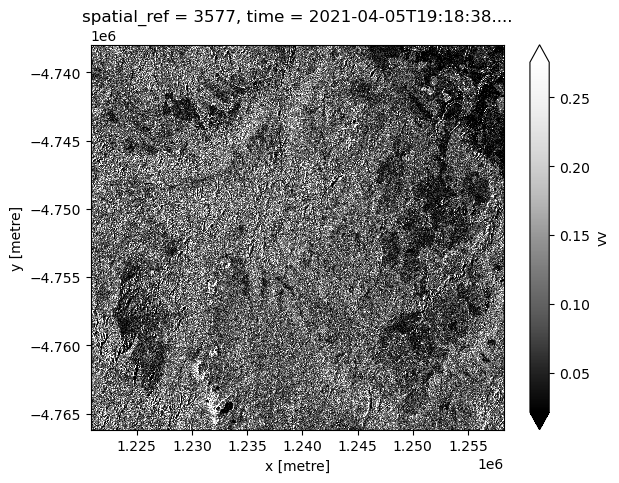

In [12]:
#Visually check Sentinel 1 dataset
ds1.isel(time = [0]).vv.plot(size=5, cmap="Greys_r",robust = True) 

Combine different times imagery into dataset

In [10]:
#First load
ds_combined = ds1.isel(time = [0]) # run this for the first dataset
ds_combined = ds_combined.load() #run this for the first dataset: load all data from dask chunks

#subsequent loads (activate this code)
#ds1_temporary = ds1.isel(time = [0]) #run this for the subsequent datasets
#ds1_temporary = ds1_temporary.load() #run this for the subsequent datasets: load all data from dask chunks
#ds_combined = xr.concat([ds_combined, ds1_temporary], dim='time') #run this for the subsequent datasets
#del ds1_temporary

#ds_combined times: 2020-04-03T09:09:24.177569,2021-04-05T19:18:38.034485000, 2022-04-12T19:18:43.645731000
#ds1.sel(time = '2021-04-05T19:18:38.034485000')

In [11]:
#inspect dataset
ds_combined

<xarray.Dataset> Size: 21MB
Dimensions:      (y: 1410, x: 1871, time: 1)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
  * time         (time) datetime64[ns] 8B 2021-04-05T19:18:38.034485
Data variables:
    vh           (time, y, x) float32 11MB 0.007282 0.0104 ... 0.03379 0.0434
    vv           (time, y, x) float32 11MB 0.1108 0.06863 ... 0.1248 0.1271

Process bands: * band scaling to dB

In [19]:
#convert vv and vh bands to decibel scale
def dB_scale(data): 
    '''Scales a xarray.DataArray with linear DN to a dB scale.'''
    # Explicitly set negative data to nan to avoid log of negative number
    negative_free_data = data.where(data >= 0, np.nan)
    return 10 * np.log10(negative_free_data)

In [20]:
ds_combined["vh_dB"] = dB_scale(ds_combined.vh)
ds_combined["vv_dB"] = dB_scale(ds_combined.vv)

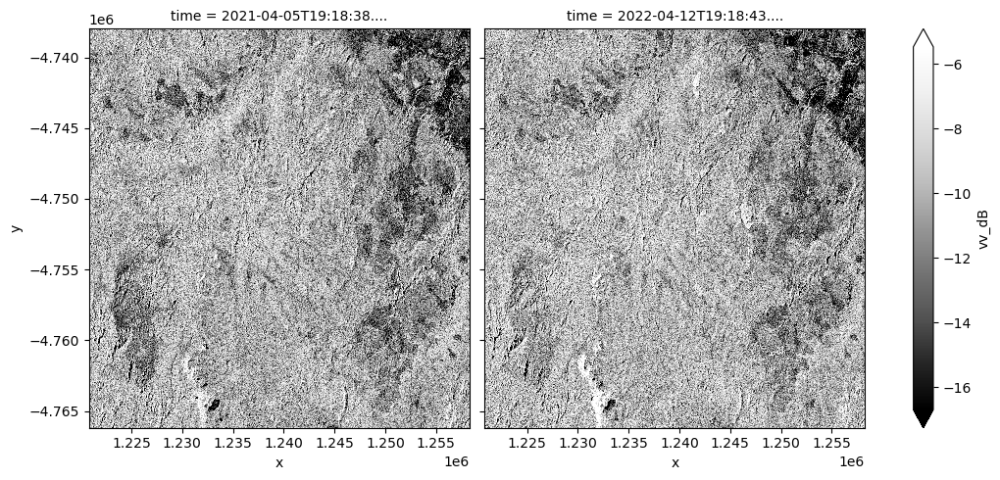

In [36]:
#Visually inspect combined dataset
ds_combined.vv_dB.plot(size=5, cmap="Greys_r",robust = True, col = 'time')

  #ds.vh.sel(time = '2021-04-05T19:18:38.034485000').plot(size=5, cmap="Greys_r",robust = True)

In [4]:
#Visually inspect combined dataset
ds_combined.vh_dB.plot(size=5, cmap="Greys_r",robust = True, col = 'time')

NameError: name 'ds_combined' is not defined

In [23]:
#checkpoint: safe resulting combined dataset to NETcdf
ds_combined.to_netcdf(f"../Project/Outputs/S1RCT20m_combined_2021_2022.nc")

In [19]:
#import created ds_combined if needed
#ds_combined = xr.open_dataset(f"../Project/Outputs/S1RCT20m_combined_2021_2022.nc")

In [20]:
#ds_combined

<xarray.Dataset> Size: 84MB
Dimensions:      (time: 2, y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
  * time         (time) datetime64[ns] 16B 2021-04-05T19:18:38.034485 2022-04...
Data variables:
    vh           (time, y, x) float32 21MB ...
    vv           (time, y, x) float32 21MB ...
    spatial_ref  int32 4B ...
    vh_dB        (time, y, x) float32 21MB ...
    vv_dB        (time, y, x) float32 21MB ...

## Import labeled classes dataset

In [55]:
# Load the polygons
class_training_gpd = gpd.read_file('../Project/Inputs/Styx_class_training_polygons/Tas_deforestation_202203_Vectorized_1area_clean.shp')

In [60]:
#inspect imported geopandas dataframe
class_training_gpd

,deforestation_class,geometry
0,1,"POLYGON ((1254190.000 -4742010.000, 1254350.00..."
1,1,"POLYGON ((1254740.000 -4742010.000, 1254810.00..."
2,2,"POLYGON ((1228580.000 -4742010.000, 1229010.00..."
3,1,"POLYGON ((1231630.000 -4742070.000, 1231650.00..."
4,1,"POLYGON ((1255330.000 -4742010.000, 1255370.00..."
...,...,...
1407,1,"POLYGON ((1254100.000 -4761780.000, 1254120.00..."
1408,2,"POLYGON ((1225820.000 -4761980.000, 1225860.00..."
1409,1,"POLYGON ((1227250.000 -4762080.000, 1227260.00..."
1410,1,"POLYGON ((1251300.000 -4761910.000, 1251340.00..."


In [59]:
# clean geodataframe 
class_training_gpd = class_training_gpd.drop(columns=['Area_1'])
class_training_gpd = class_training_gpd.rename(columns={'Deforestat': 'deforestation_class'})

In [61]:
class_training_gpd.deforestation_class.unique()

array([1, 2])

In [54]:
#Visually inspect geopandas dataframe
class_training_gpd.explore(column='deforestation_class')

In [37]:
ds_combined.vv_dB.isel(time = [1]).rio.crs

CRS.from_epsg(3577)

In [62]:
# Rasterize the polygon geometries ('deforestation_class') onto the raster template from the xarray dataset (ds_clipped)
deforestation_raster = xr_rasterize(
    gdf=class_training_gpd,                         # Your geopandas GeoDataFrame
    da=ds_combined.vv_dB.isel(time = [0]),                     # Your xarray DataArray (vv band), used as the template
    attribute_col='deforestation_class',   # Column in polygons to rasterize (e.g., deforestation class)
    crs=ds_combined.vv_dB.isel(time = [0]).rio.crs,                # Coordinate reference system
    name='deforestation_class',                  # Name of the resulting DataArray
    all_touched = False # Set all_touched to False (default)
)

In [63]:
deforestation_raster

<xarray.DataArray 'deforestation_class' (y: 1410, x: 1871)> Size: 21MB
array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577

In [64]:
#deforestation_dataset_2021 = deforestation_raster.to_dataset(name='deforestation_class')
deforestation_dataset_2022 = deforestation_raster.to_dataset(name='deforestation_class')

In [65]:
deforestation_dataset_2022

<xarray.Dataset> Size: 21MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
Data variables:
    deforestation_class  (y, x) int64 21MB 0 0 0 0 0 0 0 0 0 ... 0 0 0 0 0 0 0 0

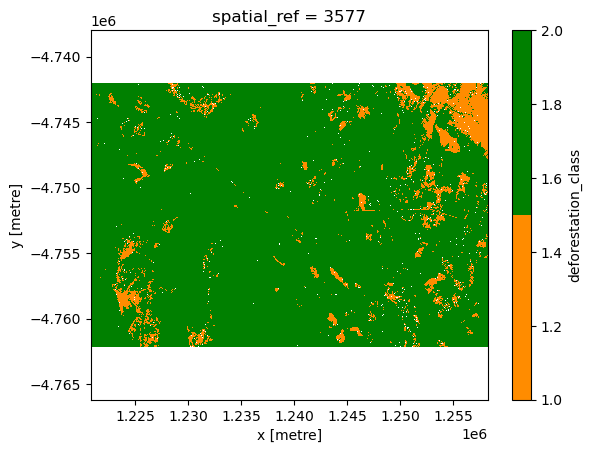

In [34]:
#deforestation_dataset_2022['deforestation_class'].where(deforestation_dataset.deforestation_class != 0).plot(cmap=ListedColormap(['darkorange','green']),
#                                    add_labels=True,
#                                    add_colorbar=True)
deforestation_dataset_2021['deforestation_class'].where(deforestation_dataset_2021.deforestation_class != 0).plot(cmap=ListedColormap(['darkorange','green']),
                                    add_labels=True,
                                    add_colorbar=True)

In [66]:
np.unique(deforestation_dataset_2022['deforestation_class'])

array([0, 1, 2])

In [45]:
# Write GeoTIFF to a location 2021
deforestation_dataset_2021['deforestation_class'] = deforestation_dataset_2021['deforestation_class'].where(deforestation_dataset_2021.deforestation_class != 0)

write_cog(geo_im=deforestation_dataset_2021['deforestation_class'],
          fname=f'../Project/Outputs/Tas_deforestation_class_2021.tif',
          overwrite=True)

PosixPath('../Project/Outputs/Tas_deforestation_class_2021.tif')

In [67]:
# Write GeoTIFF to a location 2022
deforestation_dataset_2022['deforestation_class'] = deforestation_dataset_2022['deforestation_class'].where(deforestation_dataset_2022.deforestation_class != 0)

write_cog(geo_im=deforestation_dataset_2022['deforestation_class'],
          fname=f'../Project/Outputs/Tas_deforestation_class_2022.tif',
          overwrite=True)

PosixPath('../Project/Outputs/Tas_deforestation_class_2022.tif')

In [9]:
# Open into an xarray.DataArray
#deforestation_dataset = rioxarray.open_rasterio('../Project/Outputs/Tas_deforestation_class_2022.tif')
#deforestation_dataset

# Covert our xarray.DataArray into a xarray.Dataset
#deforestation_dataset = deforestation_dataset.to_dataset('band')
#deforestation_dataset.rename({1: 'deforestation_class'})
#deforestation_dataset

<xarray.DataArray (band: 1, y: 1410, x: 1871)> Size: 21MB
[2638110 values with dtype=float64]
Coordinates:
  * band         (band) int64 8B 1
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    _FillValue:     nan
    scale_factor:   1.0
    add_offset:     0.0

## Combine reference and satellite datasets

Normal classification: two sentinel1 rct images from 2021 and 2022 will be used to train the RF, then each image will be cliped to the corresponding year reference dataset

In [68]:
# mask sentinel1 dataset (ds_combined) to pixels that have deforestation classes (1,2)
mask = 0 #avoid other mask variables to be passed in
mask = (deforestation_dataset_2022.deforestation_class == 1) | (deforestation_dataset_2022.deforestation_class == 2)

ds_2022_masked = ds_combined.sel(time = '2022-04-12T19:18:43.645731000').where(mask)
ds_2022_masked
#ds_2021_masked = ds_combined.sel(time = '2021-04-05T19:18:38.034485000').where(mask)

<xarray.Dataset> Size: 42MB
Dimensions:      (y: 1410, x: 1871)
Coordinates:
  * y            (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x            (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06 1.258e+06
    spatial_ref  int32 4B 3577
    time         datetime64[ns] 8B 2022-04-12T19:18:43.645731
Data variables:
    vh           (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    vv           (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    vh_dB        (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan
    vv_dB        (y, x) float32 11MB nan nan nan nan nan ... nan nan nan nan nan

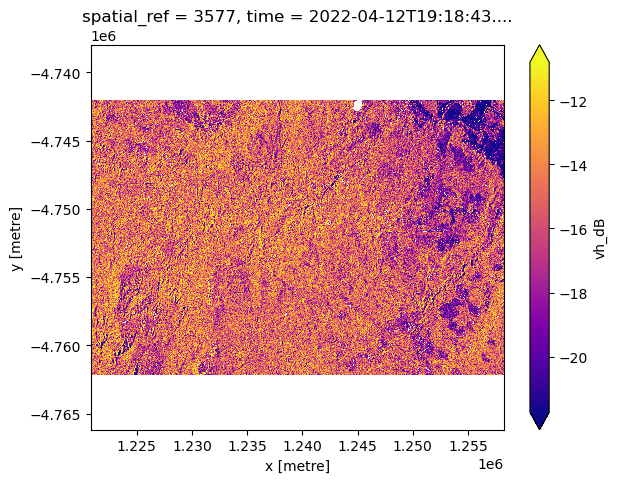

In [69]:
ds_2022_masked.vh_dB.plot(size=5, cmap="plasma",robust = True)

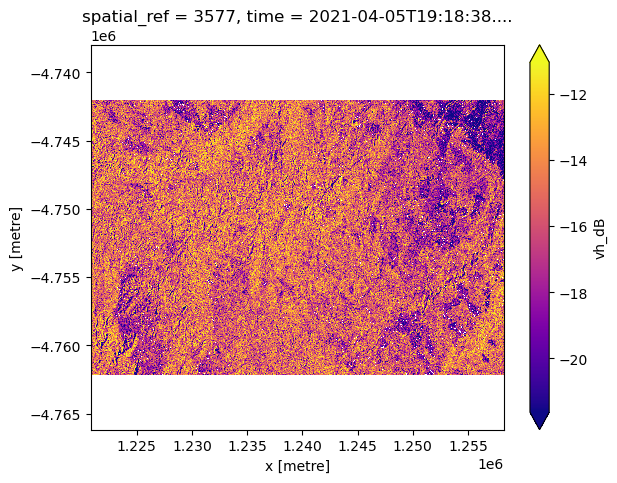

In [47]:
ds_2021_masked.vh_dB.plot(size=5, cmap="plasma",robust = True)

In [71]:
ds_training_2022 = xr.merge([deforestation_dataset_2022,ds_2022_masked.squeeze()])
#ds_training_2021 = xr.merge([deforestation_dataset_2021,ds_2021_masked.squeeze()])

Clip Sentinel 1 RCT datasets to training polygons

In [72]:
ds_training_2022

<xarray.Dataset> Size: 63MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
    time                 datetime64[ns] 8B 2022-04-12T19:18:43.645731
Data variables:
    deforestation_class  (y, x) float64 21MB nan nan nan nan ... nan nan nan nan
    vh                   (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vv                   (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vh_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vv_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan

In [50]:
ds_training_2021

<xarray.Dataset> Size: 63MB
Dimensions:              (y: 1410, x: 1871)
Coordinates:
  * y                    (y) float64 11kB -4.738e+06 -4.738e+06 ... -4.766e+06
  * x                    (x) float64 15kB 1.221e+06 1.221e+06 ... 1.258e+06
    spatial_ref          int32 4B 3577
    time                 datetime64[ns] 8B 2021-04-05T19:18:38.034485
Data variables:
    deforestation_class  (y, x) float64 21MB nan nan nan nan ... nan nan nan nan
    vh                   (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vv                   (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vh_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan
    vv_dB                (y, x) float32 11MB nan nan nan nan ... nan nan nan nan

In [52]:

print('Total NaN values:',ds_training_2021.isnull().sum(),
      '\n Total non-Nan values: ',ds_training_2021.notnull().sum())

Total NaN values: <xarray.Dataset> Size: 52B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
    time                 datetime64[ns] 8B 2021-04-05T19:18:38.034485
Data variables:
    deforestation_class  int64 8B 761806
    vh                   int64 8B 761806
    vv                   int64 8B 761806
    vh_dB                int64 8B 761806
    vv_dB                int64 8B 761806 
 Total non-Nan values:  <xarray.Dataset> Size: 52B
Dimensions:              ()
Coordinates:
    spatial_ref          int32 4B 3577
    time                 datetime64[ns] 8B 2021-04-05T19:18:38.034485
Data variables:
    deforestation_class  int64 8B 1876304
    vh                   int64 8B 1876304
    vv                   int64 8B 1876304
    vh_dB                int64 8B 1876304
    vv_dB                int64 8B 1876304


In [73]:
#drop all nan values if in any of the datasets
df_training_2021 = ds_training_2021.to_dataframe().dropna() 
df_training_2021 = df_training_2021.reset_index() #convert indexes into normal columns

#####
df_training_2022 = ds_training_2022.to_dataframe().dropna() 
df_training_2022 = df_training_2022.reset_index()

In [74]:
df_training_2022

,y,x,spatial_ref,deforestation_class,vh,vv,vh_dB,vv_dB,time
0,-4742010.0,1220850.0,3577,2.0,0.068279,0.104575,-11.657119,-9.805730,2022-04-12 19:18:43.645731
1,-4742010.0,1220870.0,3577,2.0,0.041741,0.148806,-13.794384,-8.273807,2022-04-12 19:18:43.645731
2,-4742010.0,1220890.0,3577,2.0,0.058109,0.114632,-12.357596,-9.406931,2022-04-12 19:18:43.645731
3,-4742010.0,1220910.0,3577,2.0,0.031188,0.115874,-15.060123,-9.360125,2022-04-12 19:18:43.645731
4,-4742010.0,1220930.0,3577,2.0,0.035640,0.072327,-14.480587,-11.407005,2022-04-12 19:18:43.645731
...,...,...,...,...,...,...,...,...,...
1873059,-4762150.0,1258170.0,3577,2.0,0.024844,0.074236,-16.047743,-11.293829,2022-04-12 19:18:43.645731
1873060,-4762150.0,1258190.0,3577,2.0,0.013814,0.063901,-18.596756,-11.944909,2022-04-12 19:18:43.645731
1873061,-4762150.0,1258210.0,3577,2.0,0.013668,0.057664,-18.642960,-12.390970,2022-04-12 19:18:43.645731
1873062,-4762150.0,1258230.0,3577,2.0,0.015249,0.054370,-18.167637,-12.646369,2022-04-12 19:18:43.645731


In [75]:
df_training_all = pd.concat([df_training_2021, df_training_2022], ignore_index=True)

In [76]:
df_training_all

,y,x,spatial_ref,deforestation_class,vh,vv,vh_dB,vv_dB,time
0,-4742010.0,1220850.0,3577,2.0,0.040925,0.152663,-13.880109,-8.162650,2021-04-05 19:18:38.034485
1,-4742010.0,1220870.0,3577,2.0,0.038652,0.127611,-14.128236,-8.941134,2021-04-05 19:18:38.034485
2,-4742010.0,1220890.0,3577,2.0,0.080755,0.182422,-10.928331,-7.389226,2021-04-05 19:18:38.034485
3,-4742010.0,1220910.0,3577,2.0,0.084412,0.134439,-10.735939,-8.714752,2021-04-05 19:18:38.034485
4,-4742010.0,1220930.0,3577,2.0,0.037778,0.135578,-14.227582,-8.678105,2021-04-05 19:18:38.034485
...,...,...,...,...,...,...,...,...,...
3749363,-4762150.0,1258170.0,3577,2.0,0.024844,0.074236,-16.047743,-11.293829,2022-04-12 19:18:43.645731
3749364,-4762150.0,1258190.0,3577,2.0,0.013814,0.063901,-18.596756,-11.944909,2022-04-12 19:18:43.645731
3749365,-4762150.0,1258210.0,3577,2.0,0.013668,0.057664,-18.642960,-12.390970,2022-04-12 19:18:43.645731
3749366,-4762150.0,1258230.0,3577,2.0,0.015249,0.054370,-18.167637,-12.646369,2022-04-12 19:18:43.645731


### Process training dataset

In [77]:
df_training_all = df_training_all.reset_index() #convert indexes into normal columns
df_training_all.drop(columns=['x','y','spatial_ref','time','vh','vv'], inplace=True)
df_training_all

,index,deforestation_class,vh_dB,vv_dB
0,0,2.0,-13.880109,-8.162650
1,1,2.0,-14.128236,-8.941134
2,2,2.0,-10.928331,-7.389226
3,3,2.0,-10.735939,-8.714752
4,4,2.0,-14.227582,-8.678105
...,...,...,...,...
3749363,3749363,2.0,-16.047743,-11.293829
3749364,3749364,2.0,-18.596756,-11.944909
3749365,3749365,2.0,-18.642960,-12.390970
3749366,3749366,2.0,-18.167637,-12.646369


In [14]:
df_training_all.describe()

,index,deforestation_class,vh_dB,vv_dB
count,3.749368e+06,3.749368e+06,3.749368e+06,3.749368e+06
mean,1.874684e+06,1.911060e+00,-1.568148e+01,-1.053902e+01
std,1.082349e+06,2.846565e-01,2.564003e+00,2.621179e+00
min,0.000000e+00,1.000000e+00,-3.329054e+01,-2.894265e+01
25%,9.373418e+05,2.000000e+00,-1.722207e+01,-1.215971e+01
50%,1.874684e+06,2.000000e+00,-1.550530e+01,-1.039941e+01
75%,2.812025e+06,2.000000e+00,-1.393848e+01,-8.770867e+00
max,3.749367e+06,2.000000e+00,5.415085e+00,1.205726e+01


In [79]:
df_training_all.to_csv('../Project/Outputs/Tas_S1RCT_training_all.csv', index=False)

In [27]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.model_selection import StratifiedKFold

In [28]:
#load dataset from csv if required
df_training_all = pd.read_csv('../Project/Outputs/Tas_S1RCT_training_all.csv')

In [5]:
#Dataset Checks
#df_training_clean['deforestation_class'].unique()
#df_training_clean.describe()
#df_training_clean.isna().any()

array([1, 2])

In [29]:
# Separate the two classes
class_1 = df_training_all[df_training_all['deforestation_class'] == 1]  # Deforestation
class_2 = df_training_all[df_training_all['deforestation_class'] == 2]  # Non-deforestation

# Downsample class 2 (non-deforestation)
# len(class_1) gives the number of deforestation instances, which we want to match
class_1_downsampled = class_1.sample(n=41146, random_state=42) #same sample number as the bitemporal dataset of deforestation class
class_2_downsampled = class_2.sample(n=51304, random_state=42) #same sample number as the bitemporal dataset of non-deforestation class

# Combine the downsampled class 2 with the original class 1
balanced_df_training_all = pd.concat([class_1_downsampled, class_2_downsampled])

# Shuffle the dataset to mix the classes
balanced_df_training_all = balanced_df_training_all.sample(frac=1, random_state=42).reset_index(drop=True)

# Check the balance of the dataset
print(balanced_df_training_all['deforestation_class'].value_counts())

deforestation_class
2.0    51304
1.0    41146
Name: count, dtype: int64


In [30]:
balanced_df_training_all

,index,deforestation_class,vh_dB,vv_dB
0,1219763,2.0,-16.205194,-12.913557
1,48472,2.0,-15.141629,-11.183146
2,413942,2.0,-14.988507,-9.557775
3,1961885,1.0,-23.405480,-21.965118
4,1212146,2.0,-9.812396,-9.386264
...,...,...,...,...
92445,1921166,1.0,-15.998664,-11.394257
92446,604446,2.0,-16.624090,-7.655170
92447,3352048,2.0,-16.044380,-13.688474
92448,2087745,1.0,-18.513397,-13.121958


In [24]:
balanced_df_training_all.to_csv('../Project/Outputs/Tas_S1RCT_balanced_training_all_normal.csv', index=False)

In [31]:
# Separate features and labels
X = balanced_df_training_all[['vh_dB', 'vv_dB']]  # Features (VV and VH bands)
y = balanced_df_training_all['deforestation_class']  # Target (deforestation class)

In [32]:
# Split the dataset
 #random approach 
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [33]:
y_test.describe()

count    18490.000000
mean         1.557545
std          0.496691
min          1.000000
25%          1.000000
50%          2.000000
75%          2.000000
max          2.000000
Name: deforestation_class, dtype: float64

In [20]:
del rf_classifier

NameError: name 'rf_classifier' is not defined

In [34]:
# Create a random forest classifier
rf_classifier = RandomForestClassifier(n_estimators=500,max_features=3, random_state=42, n_jobs=-1)

# Train the classifier on the training data
rf_classifier.fit(X_train, y_train)

RandomForestClassifier(max_features=3, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [35]:
#save classifier
import joblib
joblib.dump(rf_classifier, '../Project/Outputs/Classifiers/rf_normal_class_model.joblib')

['../Project/Outputs/Classifiers/rf_normal_class_model.joblib']

In [36]:
# Predict on the test set
y_pred = rf_classifier.predict(X_test)

# Calculate the accuracy
accuracy = accuracy_score(y_test, y_pred)
print(f'Accuracy: {accuracy * 100:.2f}%')

# Print classification report
print(classification_report(y_test, y_pred))

Accuracy: 70.56%
              precision    recall  f1-score   support

         1.0       0.68      0.63      0.65      8181
         2.0       0.72      0.77      0.74     10309

    accuracy                           0.71     18490
   macro avg       0.70      0.70      0.70     18490
weighted avg       0.70      0.71      0.70     18490



In [37]:
from sklearn.metrics import cohen_kappa_score

# Assuming y_test and y_pred are already defined from your model predictions
kappa = cohen_kappa_score(y_test, y_pred)
print(f'Kappa Accuracy: {kappa:.2f}')

Kappa Accuracy: 0.40


### Inspect training dataset

In [3]:
df =pd.read_csv('../Project/Outputs/Tas_S1RCT_balanced_training_all_normal.csv')

In [4]:
df

,index,deforestation_class,vh_dB,vv_dB
0,1219763,2.0,-16.205194,-12.913557
1,48472,2.0,-15.141629,-11.183146
2,413942,2.0,-14.988507,-9.557775
3,1961885,1.0,-23.405480,-21.965118
4,1212146,2.0,-9.812396,-9.386264
...,...,...,...,...
92445,1921166,1.0,-15.998664,-11.394257
92446,604446,2.0,-16.624090,-7.655170
92447,3352048,2.0,-16.044380,-13.688474
92448,2087745,1.0,-18.513397,-13.121958


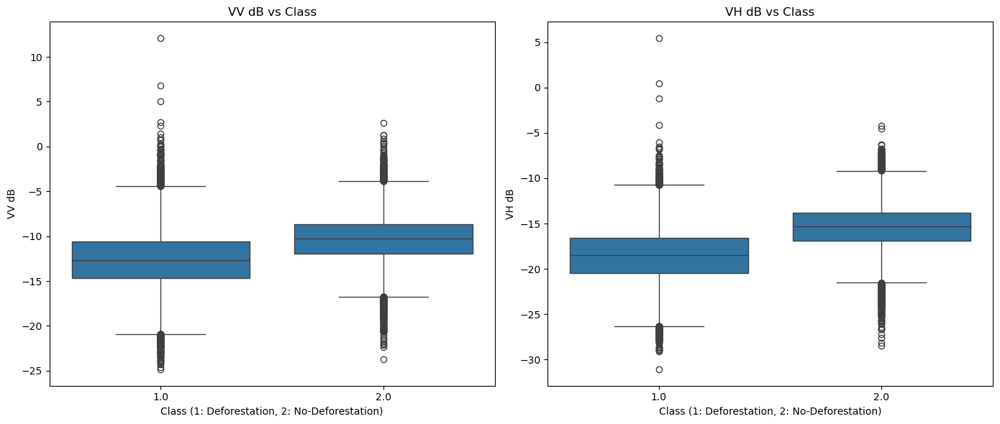

In [5]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming your DataFrame is named 'df'
# df = pd.DataFrame({...}) 

# Set up the plotting space
plt.figure(figsize=(14, 6))

# Box plot for vv_dB by categorical_class
plt.subplot(1, 2, 1)
sns.boxplot(x='deforestation_class', y='vv_dB', data=df)
plt.title('VV dB vs Class')
plt.xlabel('Class (1: Deforestation, 2: No-Deforestation)')
plt.ylabel('VV dB')

# Box plot for vh_dB by categorical_class
plt.subplot(1, 2, 2)
sns.boxplot(x='deforestation_class', y='vh_dB', data=df)
plt.title('VH dB vs Class')
plt.xlabel('Class (1: Deforestation, 2: No-Deforestation)')
plt.ylabel('VH dB')

plt.tight_layout()
plt.show()

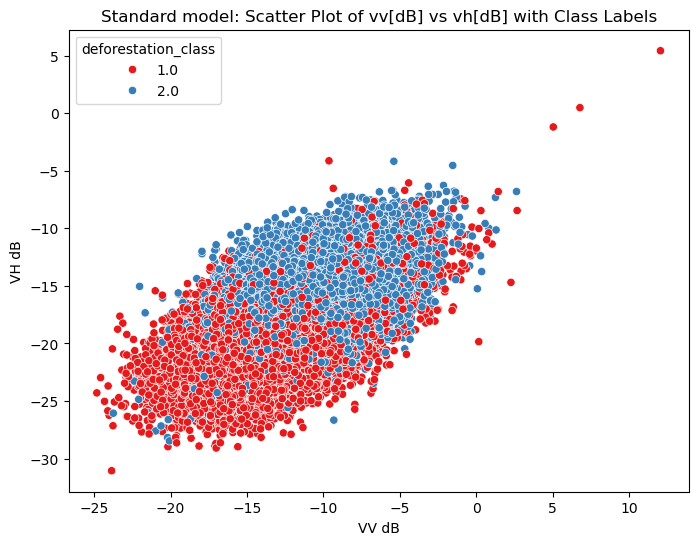

In [8]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x='vv_dB', y='vh_dB', hue='deforestation_class', palette='Set1', data=df)
plt.title('Standard model: Scatter Plot of vv[dB] vs vh[dB] with Class Labels')
plt.xlabel('VV dB')
plt.ylabel('VH dB')
plt.show()